Lambda School Data Science

*Unit 2, Sprint 2, Module 4*

---

# Classification Metrics

## Assignment
- [ ] If you haven't yet, [review requirements for your portfolio project](https://lambdaschool.github.io/ds/unit2), then submit your dataset.
- [ ] Plot a confusion matrix for your Tanzania Waterpumps model.
- [ ] Continue to participate in our Kaggle challenge. Every student should have made at least one submission that scores at least 70% accuracy (well above the majority class baseline).
- [ ] Submit your final predictions to our Kaggle competition. Optionally, go to **My Submissions**, and _"you may select up to 1 submission to be used to count towards your final leaderboard score."_
- [ ] Commit your notebook to your fork of the GitHub repo.
- [ ] Read [Maximizing Scarce Maintenance Resources with Data: Applying predictive modeling, precision at k, and clustering to optimize impact](http://archive.is/DelgE), by Lambda DS3 student Michael Brady. His blog post extends the Tanzania Waterpumps scenario, far beyond what's in the lecture notebook.


## Stretch Goals

### Reading

- [Attacking discrimination with smarter machine learning](https://research.google.com/bigpicture/attacking-discrimination-in-ml/), by Google Research, with  interactive visualizations. _"A threshold classifier essentially makes a yes/no decision, putting things in one category or another. We look at how these classifiers work, ways they can potentially be unfair, and how you might turn an unfair classifier into a fairer one. As an illustrative example, we focus on loan granting scenarios where a bank may grant or deny a loan based on a single, automatically computed number such as a credit score."_
- [Notebook about how to calculate expected value from a confusion matrix by treating it as a cost-benefit matrix](https://github.com/podopie/DAT18NYC/blob/master/classes/13-expected_value_cost_benefit_analysis.ipynb)
- [Visualizing Machine Learning Thresholds to Make Better Business Decisions](https://blog.insightdatascience.com/visualizing-machine-learning-thresholds-to-make-better-business-decisions-4ab07f823415)


### Doing
- [ ] Share visualizations in our Slack channel!
- [ ] RandomizedSearchCV / GridSearchCV, for model selection. (See module 3 assignment notebook)
- [ ] Stacking Ensemble. (See module 3 assignment notebook)
- [ ] More Categorical Encoding. (See module 2 assignment notebook)

In [1]:
%%capture
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Kaggle-Challenge/master/data/'
    !pip install category_encoders==2.*

# If you're working locally:
else:
    DATA_PATH = '../data/'

In [2]:
import pandas as pd

# Merge train_features.csv & train_labels.csv
train = pd.merge(pd.read_csv(DATA_PATH+'waterpumps/train_features.csv'), 
                 pd.read_csv(DATA_PATH+'waterpumps/train_labels.csv'))

# Read test_features.csv & sample_submission.csv
test = pd.read_csv(DATA_PATH+'waterpumps/test_features.csv')
sample_submission = pd.read_csv(DATA_PATH+'waterpumps/sample_submission.csv')

In [3]:
from sklearn.model_selection import train_test_split

train, val = train_test_split(train, test_size=len(test),
                              stratify=train["status_group"],
                              random_state=37)

train.shape, val.shape

((45042, 41), (14358, 41))

In [4]:
train["status_group"].value_counts(normalize=True)

functional                 0.543071
non functional             0.384241
functional needs repair    0.072688
Name: status_group, dtype: float64

In [5]:
from pandas_profiling import ProfileReport
profile = ProfileReport(train, minimal=True).to_notebook_iframe()

profile

In [6]:
import plotly.express as px
px.scatter(train, x="longitude", y="latitude", color="status_group")

In [7]:
import numpy as np

def wrangle(X):
# ```This is a data-wrangling function.```    
    
    X = X.copy()
    
    X["latitude"] = X["latitude"].replace(-2e-08, 0)
    
    zero_cols = ["longitude", "latitude", "amount_tsh",
                "num_private", "population", "public_meeting",
                "permit", "construction_year", "gps_height"]
    
    for col in zero_cols:
        X[col] = X[col].replace(0, np.nan)
        
    X["date_recorded"] = pd.to_datetime(X["date_recorded"], infer_datetime_format=True)
    X["year_recorded"] = X["date_recorded"].dt.year
    X["month_recorded"] = X["date_recorded"].dt.month
    X["day_recorded"] = X["date_recorded"].dt.day
    X = X.drop(columns="date_recorded")
    X["years"] = X["year_recorded"] - X["construction_year"]

# Dropping highly correlated cells, unique value and redundancy.
    X = X.drop(["extraction_type_group", "extraction_type_class", "management_group",
               "quality_group", "payment_type", "quantity_group", "source_type",
               "source_class", "waterpoint_type_group", "recorded_by", "id", "month_recorded",
               "day_recorded", "year_recorded"], axis=1)
    
    return X

train = wrangle(train)
val = wrangle(val)
test = wrangle(test)

In [8]:
px.scatter(train, x="longitude", y="latitude", color="status_group")

In [24]:
target = "status_group"

X_train = train.drop(target, axis=1)
X_val = val.drop(target, axis=1)
y_train = train[target]
y_val = val[target]
X_test = test

In [10]:
X_train.shape

(45042, 29)

In [15]:
%matplotlib inline

import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

estimator = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(),
    StandardScaler(),
    RandomForestClassifier(n_jobs=1, random_state=31)
)

In [16]:
%%time

params = {
    "simpleimputer__strategy" : ("median", "most_frequent"),
    "randomforestclassifier__criterion" : ("gini", "entropy"),
    "randomforestclassifier__max_depth" : (91, 93, 95),
    "randomforestclassifier__min_samples_split" : (5, 7, 10),
    "randomforestclassifier__max_features" : (17, 19, 22),
}

CV_model = RandomizedSearchCV(
    estimator,
    param_distributions=params,
    n_iter=36,
    scoring="accuracy",
    n_jobs=4,
    cv=5,
    verbose=1,
    random_state=15,
    return_train_score=True
)

CV_model.fit(X_train, y_train)

print("Best CV:", CV_model.best_score_)
print("Estimator:", CV_model.best_params_)
print("Model:", CV_model.best_estimator_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed: 15.1min
[Parallel(n_jobs=4)]: Done 180 out of 180 | elapsed: 63.8min finished


Best CV: 0.8027174990984938
Estimator: {'simpleimputer__strategy': 'median', 'randomforestclassifier__min_samples_split': 10, 'randomforestclassifier__max_features': 19, 'randomforestclassifier__max_depth': 95, 'randomforestclassifier__criterion': 'entropy'}
Model: Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['funder', 'installer', 'wpt_name',
                                      'basin', 'subvillage', 'region', 'lga',
                                      'ward', 'public_meeting',
                                      'scheme_management', 'scheme_name',
                                      'permit', 'extraction_type', 'management',
                                      'payment', 'water_quality', 'quantity',
                                      'source', 'waterpoint_type'],
                                mapping=[{'col': 'funder',
                                          'data_type': dtype('O'),
                                          'mapping': Miss

In [17]:
print("Training Accuracy:", CV_model.score(X_train, y_train))
print("Validation Accuracy:", CV_model.score(X_val, y_val))

Training Accuracy: 0.9498912126459749
Validation Accuracy: 0.7989970748015044


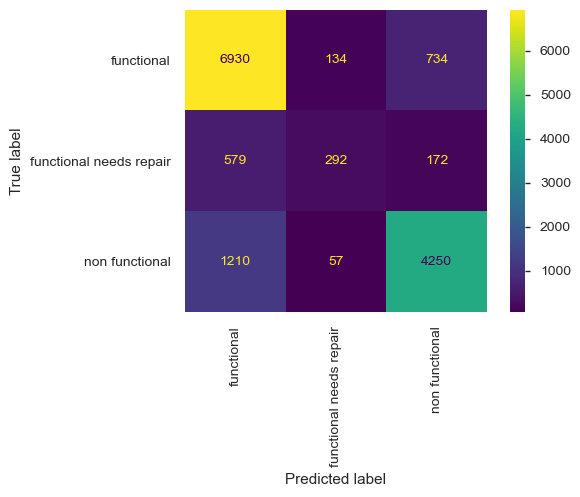

In [18]:
from sklearn.metrics import plot_confusion_matrix, classification_report

plt.rcParams["figure.dpi"] = 100
plot_confusion_matrix(CV_model, X_val, y_val, values_format=".0f", xticks_rotation="vertical")

In [25]:
X_train_ = pd.concat(objs=(X_train, X_val), axis=0)
y_train_ = pd.concat(objs=(y_train, y_val), axis=0)

In [26]:
print("Training Accuracy:", CV_model.score(X_train_, y_train_))

Training Accuracy: 0.9134175084175085


In [27]:
y_pred = CV_model.predict(X_test)

In [28]:
print(classification_report(y_val, y_pred))

                         precision    recall  f1-score   support

             functional       0.54      0.60      0.57      7798
functional needs repair       0.08      0.04      0.05      1043
         non functional       0.38      0.37      0.38      5517

               accuracy                           0.47     14358
              macro avg       0.34      0.34      0.33     14358
           weighted avg       0.45      0.47      0.46     14358



In [29]:
DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Kaggle-Challenge/master/data/'
whyse_submission4 = pd.read_csv(DATA_PATH+'waterpumps/sample_submission.csv')
submission4 = whyse_submission4.copy()
submission4['status_group'] = y_pred
submission4.to_csv('whyse-submission4.csv', index=False)